# GitHub Ecosystem Mapping

In this notebook we will explore the Augur GitHub data to generate an ecosystem mapping of open source projects and communities by studying graphs based on relations such as common contributors and project activities between different GitHub repositories.

## Connect to Augur database

Until the Operate First enviroment can connect to the DB, use config file to access. Do not push config file to Github repo

In [1]:
import psycopg2
import pandas as pd 
import sqlalchemy as salc
import json
import os
import networkx as nx
import matplotlib.pyplot as plt

with open("comm_cage.json") as config_file:
    config = json.load(config_file)

In [2]:
database_connection_string = 'postgresql+psycopg2://{}:{}@{}:{}/{}'.format(config['user'], config['password'], config['host'], config['port'], config['database'])

dbschema='augur_data'
engine = salc.create_engine(
    database_connection_string,
    connect_args={'options': '-csearch_path={}'.format(dbschema)})

## Retrieve Available Respositories

In [3]:
#add your repo git url(s) here of the repo(s) you want to query if known (and in the database)
repo_git_set = ['https://github.com/containers/storage',
'https://github.com/containers/image',
'https://github.com/containers/skopeo',
'https://github.com/containers/crun',
'https://github.com/containers/fuse-overlayfs',
'https://github.com/containers/common',
'https://github.com/containers/container-selinux',
'https://github.com/containers/bubblewrap',
'https://github.com/containers/toolbox',
'https://github.com/containers/udica',
'https://github.com/containers/libkrun',
'https://github.com/containers/conmon',
'https://github.com/containers/podman-py']
repo_set = []
repo_name_set = []

for repo_git in repo_git_set:
    repo_query = salc.sql.text(f"""
                 SET SCHEMA 'augur_data';
                 SELECT 
                    b.repo_id,
                    b.repo_name
                FROM
                    repo_groups a,
                    repo b
                WHERE
                    a.repo_group_id = b.repo_group_id AND
                    b.repo_git = \'{repo_git}\'
        """)

    t = engine.execute(repo_query)
    results = t.mappings().all()[0]
    repo_id = results['repo_id']
    repo_name = results['repo_name']
    repo_set.append(repo_id)
    repo_name_set.append(repo_name)
print(repo_set)
print(repo_name_set)

[27047, 27044, 27017, 27029, 27043, 27028, 27041, 27032, 27036, 27022, 27034, 27033, 27020]
['storage', 'image', 'skopeo', 'crun', 'fuse-overlayfs', 'common', 'container-selinux', 'bubblewrap', 'toolbox', 'udica', 'libkrun', 'conmon', 'podman-py']


## Retrieve Issue Contributors

We will now fetch all Issue contributors for various repositories.

In [4]:
issue_contrib = pd.DataFrame()
for repo_id in repo_set:
    repo_query = salc.sql.text(f"""
                SET SCHEMA 'augur_data';
                SELECT r.repo_id,
                r.repo_git,
                i.cntrb_id,
                i.issue_id
                FROM
                repo r, issues i
                 WHERE
                i.repo_id = \'{repo_id}\' AND
                i.repo_id = r.repo_id
        """)
    df_current_repo = pd.read_sql(repo_query, con=engine)
    issue_contrib = pd.concat([issue_contrib, df_current_repo])

issue_contrib = issue_contrib.reset_index()
issue_contrib.drop("index", axis=1, inplace=True)
issue_contrib.columns =['Repo ID', 'Git', 'Issue Authors', 'Issue ID']
display(issue_contrib)
issue_contrib.dtypes

,Repo ID,Git,Issue Authors,Issue ID
0,27047,https://github.com/containers/storage,NaN,294412
1,27047,https://github.com/containers/storage,NaN,294421
2,27047,https://github.com/containers/storage,NaN,294423
3,27047,https://github.com/containers/storage,NaN,294425
4,27047,https://github.com/containers/storage,NaN,294440
...,...,...,...,...
9561,27020,https://github.com/containers/podman-py,2208867.0,296191
9562,27020,https://github.com/containers/podman-py,2244791.0,296195
9563,27020,https://github.com/containers/podman-py,NaN,2636277
9564,27020,https://github.com/containers/podman-py,NaN,2636279


Repo ID            int64
Git               object
Issue Authors    float64
Issue ID           int64
dtype: object

## Retrieve PR Contributors

We will now fetch all the PR contributors for various repositories.

In [5]:
pr_contrib = pd.DataFrame()

for repo_id in repo_set:
    repo_query = salc.sql.text(f"""
                SET SCHEMA 'augur_data';
                SELECT r.repo_id,
                r.repo_git,
                prm.cntrb_id,
                prm.pull_request_id
                FROM
                repo r, pull_request_meta prm
                WHERE
                prm.repo_id = \'{repo_id}\' AND
                prm.repo_id = r.repo_id
                LIMIT 50000
        """)
    df_current_repo = pd.read_sql(repo_query, con=engine)
    pr_contrib = pd.concat([pr_contrib, df_current_repo])

pr_contrib = pr_contrib.reset_index()
pr_contrib.drop("index", axis=1, inplace=True)
pr_contrib.columns =['Repo ID', 'Git', 'PR Creators', 'PR ID']
display(pr_contrib)
pr_contrib.dtypes

,Repo ID,Git,PR Creators,PR ID
0,27047,https://github.com/containers/storage,57932,367641
1,27047,https://github.com/containers/storage,63501,367640
2,27047,https://github.com/containers/storage,2207432,367640
3,27047,https://github.com/containers/storage,63501,367642
4,27047,https://github.com/containers/storage,2207432,367642
...,...,...,...,...
12755,27020,https://github.com/containers/podman-py,2244797,1684528
12756,27020,https://github.com/containers/podman-py,2207432,1684528
12757,27020,https://github.com/containers/podman-py,2207432,1684530
12758,27020,https://github.com/containers/podman-py,61916,1684531


Repo ID         int64
Git            object
PR Creators     int64
PR ID           int64
dtype: object

## Retrieve PR Reviewers

We will now fetch all the PR Reviewers for various repositories.

In [6]:
prr_contrib = pd.DataFrame()

for repo_id in repo_set:
    repo_query = salc.sql.text(f"""
                SET SCHEMA 'augur_data';
                SELECT r.repo_id,
                r.repo_git,
                prr.cntrb_id,
                prr.pull_request_id
                FROM
                repo r, pull_request_reviews prr
                WHERE
                prr.repo_id = \'{repo_id}\' AND
                prr.repo_id = r.repo_id
        """)
    df_current_repo = pd.read_sql(repo_query, con=engine)
    prr_contrib = pd.concat([prr_contrib, df_current_repo])

pr_contrib = pr_contrib.reset_index()
pr_contrib.drop("index", axis=1, inplace=True)
prr_contrib.columns =['Repo ID', 'Git', 'PR Reviewers', 'PRR ID']
display(prr_contrib)
prr_contrib.dtypes

,Repo ID,Git,PR Reviewers,PRR ID


Repo ID         object
Git             object
PR Reviewers    object
PRR ID          object
dtype: object

## Retrieve Commit Contributors

We will now fetch all the Commit contributors for various repositories.

In [7]:
commit_contrib = pd.DataFrame()

for repo_id in repo_set:
    repo_query = salc.sql.text(f"""
                SET SCHEMA 'augur_data';
                SELECT r.repo_id,
                r.repo_git,
                ca.cntrb_id,
                c.cmt_id
                FROM
                repo r, commits c, contributors_aliases ca
                WHERE
                c.repo_id = \'{repo_id}\' AND
                c.repo_id = r.repo_id and
                c.cmt_committer_email = ca.alias_email
        """)
    df_current_repo = pd.read_sql(repo_query, con=engine)
    commit_contrib = pd.concat([commit_contrib, df_current_repo])

commit_contrib = commit_contrib.reset_index()
commit_contrib.drop("index", axis=1, inplace=True)
commit_contrib.columns =['Repo ID', 'Git', 'Commit Creators', 'Commit ID']
display(commit_contrib)
commit_contrib.dtypes

,Repo ID,Git,Commit Creators,Commit ID
0,27047,https://github.com/containers/storage,35421,155844022
1,27047,https://github.com/containers/storage,35421,155910822
2,27047,https://github.com/containers/storage,35421,155896125
3,27047,https://github.com/containers/storage,35421,155907333
4,27047,https://github.com/containers/storage,31088,155880004
...,...,...,...,...
127380,27020,https://github.com/containers/podman-py,2204264,94750801
127381,27020,https://github.com/containers/podman-py,2204264,94750805
127382,27020,https://github.com/containers/podman-py,2204264,94750806
127383,27020,https://github.com/containers/podman-py,2204264,94750787


Repo ID             int64
Git                object
Commit Creators     int64
Commit ID           int64
dtype: object

In [8]:
# Lets subset the first 50000 rows
commit_contrib = commit_contrib[:50000]

## Merge Data Sets

We will now merge all the data sets into a single data frame.

In [9]:
df_all_new = pd.merge(commit_contrib, issue_contrib, on=['Repo ID','Git'], how='outer')

In [10]:
len(df_all_new)

64908268

In [11]:
# Lets subset the first 50000 rows
df_all_new = df_all_new[:50000]

In [12]:
df_all_new = pd.merge(df_all_new, pr_contrib, on=['Repo ID', 'Git'], how='outer')

In [13]:
len(df_all_new)

118960381

In [14]:
df_all_new = pd.merge(df_all_new, prr_contrib, on=['Repo ID', 'Git'], how='outer')

In [15]:
len(df_all_new)

118960381

In [16]:
# Drop all duplicate records
df_all_new.drop_duplicates(inplace=True)

In [17]:
len(df_all_new)

109809478

In [ ]:
# Lets subset the rows
# df_all_subset = df_all_new[0:1000000]

In [ ]:
# len(df_all_new)

### Commit Contributor Graph

In [18]:
df_commit = df_all_new.groupby(['Repo ID', 'Commit Creators']).size().unstack(fill_value=0)
df_commit.head()

Commit Creators,27337.0,31088.0,35421.0,36166.0
Repo ID,,,,
27047,47091024,5700816,11401632,45606528


In [19]:
df_commit.columns

Float64Index([27337.0, 31088.0, 35421.0, 36166.0], dtype='float64', name='Commit Creators')

In [20]:
df_commit = df_commit.reset_index()

In [21]:
df_commit.head()

Commit Creators,Repo ID,27337.0,31088.0,35421.0,36166.0
0,27047,47091024,5700816,11401632,45606528


In [22]:
df_melted_commit = df_commit.melt(
    ['Repo ID'],
    var_name = 'Contributor',value_name='number')

In [23]:
df_melted_commit.head()

,Repo ID,Contributor,number
0,27047,27337.0,47091024
1,27047,31088.0,5700816
2,27047,35421.0,11401632
3,27047,36166.0,45606528


In [24]:
Repo_id = df_melted_commit['Repo ID'].to_list()
len(Repo_id)

4

In [25]:
contributor_id = df_melted_commit['Contributor'].to_list()
len(contributor_id)

4

In [26]:
G = nx.from_pandas_edgelist(df_melted_commit, 
                            source='Repo ID',
                            target='Contributor',
                            edge_attr='number',
                            create_using=nx.MultiGraph())

In [27]:
nodes = G.nodes()
nodes

NodeView((27047, 27337.0, 31088.0, 35421.0, 36166.0))

In [28]:
nodes = list(nodes)
len(nodes)

5

In [29]:
colors = ['blue' if n in Repo_id else 'yellow' for n in nodes]

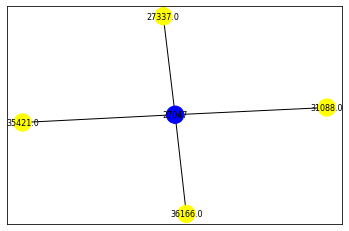

In [30]:
#fig = plt.figure(3, figsize=(500,500))
nx.draw_networkx(G, node_color=colors, font_size=8)

In [31]:
print(nx.info(G))

Name: 
Type: MultiGraph
Number of nodes: 5
Number of edges: 4
Average degree:   1.6000


### Issue Contributor Graph

In [32]:
df_issue = df_all_new.groupby(['Repo ID', 'Issue Authors']).size().unstack(fill_value=0)
df_issue.head()

Issue Authors,25639.0,26261.0,27337.0,30845.0,33723.0,35482.0,37183.0,39634.0,41565.0,43140.0,...,2235047.0,2248543.0,2270171.0,2270175.0,2270193.0,2270218.0,2270238.0,2270292.0,2274077.0,2287978.0
Repo ID,,,,,,,,,,,,,,,,,,,,,
27047,83448,83448,421632,6159780,83448,169092,83448,6779052,85644,924516,...,83448,83448,85644,83448,85644,85644,83448,83448,250344,85644


In [33]:
df_issue.columns

Float64Index([  25639.0,   26261.0,   27337.0,   30845.0,   33723.0,   35482.0,
                37183.0,   39634.0,   41565.0,   43140.0,   57824.0,   57924.0,
                57932.0,   60693.0,   63501.0,   63666.0,   65619.0,  115337.0,
               127041.0,  239581.0,  312609.0, 2204200.0, 2207426.0, 2208470.0,
              2208867.0, 2209109.0, 2209290.0, 2210894.0, 2210954.0, 2211990.0,
              2217414.0, 2217735.0, 2218462.0, 2219848.0, 2227770.0, 2235037.0,
              2235047.0, 2248543.0, 2270171.0, 2270175.0, 2270193.0, 2270218.0,
              2270238.0, 2270292.0, 2274077.0, 2287978.0],
             dtype='float64', name='Issue Authors')

In [34]:
df_issue = df_issue.reset_index()

In [35]:
df_issue.head()

Issue Authors,Repo ID,25639.0,26261.0,27337.0,30845.0,33723.0,35482.0,37183.0,39634.0,41565.0,...,2235047.0,2248543.0,2270171.0,2270175.0,2270193.0,2270218.0,2270238.0,2270292.0,2274077.0,2287978.0
0,27047,83448,83448,421632,6159780,83448,169092,83448,6779052,85644,...,83448,83448,85644,83448,85644,85644,83448,83448,250344,85644


In [36]:
df_melted_issue = df_issue.melt(
    ['Repo ID'],
    var_name = 'Contributor',value_name='number')

In [37]:
df_melted_issue.head()

,Repo ID,Contributor,number
0,27047,25639.0,83448
1,27047,26261.0,83448
2,27047,27337.0,421632
3,27047,30845.0,6159780
4,27047,33723.0,83448


In [38]:
Repo_id = df_melted_issue['Repo ID'].to_list()
len(Repo_id)

46

In [39]:
contributor_id = df_melted_issue['Contributor'].to_list()
len(contributor_id)

46

In [40]:
G = nx.from_pandas_edgelist(df_melted_issue, 
                            source='Repo ID',
                            target='Contributor',
                            edge_attr='number',
                            create_using=nx.MultiGraph())

In [41]:
nodes = G.nodes()
nodes

NodeView((27047, 25639.0, 26261.0, 27337.0, 30845.0, 33723.0, 35482.0, 37183.0, 39634.0, 41565.0, 43140.0, 57824.0, 57924.0, 57932.0, 60693.0, 63501.0, 63666.0, 65619.0, 115337.0, 127041.0, 239581.0, 312609.0, 2204200.0, 2207426.0, 2208470.0, 2208867.0, 2209109.0, 2209290.0, 2210894.0, 2210954.0, 2211990.0, 2217414.0, 2217735.0, 2218462.0, 2219848.0, 2227770.0, 2235037.0, 2235047.0, 2248543.0, 2270171.0, 2270175.0, 2270193.0, 2270218.0, 2270238.0, 2270292.0, 2274077.0, 2287978.0))

In [42]:
nodes = list(nodes)
len(nodes)

47

In [43]:
colors = ['blue' if n in Repo_id else 'yellow' for n in nodes]

In [44]:
fig = plt.figure(3, figsize=(500,500))
nx.draw_networkx(G, node_color=colors, font_size=8)

In [45]:
print(nx.info(G))

Name: 
Type: MultiGraph
Number of nodes: 47
Number of edges: 46
Average degree:   1.9574


### PR Contributor Graph

In [46]:
df_pr = df_all_new.groupby(['Repo ID', 'PR Creators']).size().unstack(fill_value=0)
df_pr.head()

PR Creators,25447,25450,25451,25546,25571,26114,26450,26650,26723,27337,...,2570101,2570138,2576928,2579219,2579343,2579390,2579391,2579475,2579481,2579485
Repo ID,,,,,,,,,,,,,,,,,,,,,
27017,0,0,0,0,2,0,10,0,0,106,...,0,0,0,0,0,0,0,1,1,1
27020,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
27022,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
27028,0,0,0,0,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,0
27029,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [47]:
df_pr = df_pr.reset_index()

In [48]:
df_melted_pr = df_pr.melt(
    ['Repo ID'],
    var_name = 'Contributor',value_name='number')

In [49]:
G = nx.from_pandas_edgelist(df_melted_pr, 
                            source='Repo ID',
                            target='Contributor',
                            edge_attr='number',
                            create_using=nx.MultiGraph())

In [50]:
nodes = G.nodes()

In [51]:
colors = ['blue' if n in Repo_id else 'yellow' for n in nodes]

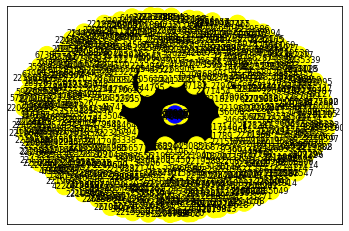

In [52]:
nx.draw_networkx(G, node_color=colors, font_size=8)

### PR Reviewers Graph

In [ ]:
df_prr = df_all_new.groupby(['Repo ID', 'PR Reviewers']).size().unstack(fill_value=0)
df_prr.head()

In [ ]:
df_prr = df_prr.reset_index()

In [ ]:
df_melted_prr = df_prr.melt(
    ['Repo ID'],
    var_name = 'Contributor',value_name='number')

In [ ]:
G = nx.from_pandas_edgelist(df_melted_prr, 
                            source='Repo ID',
                            target='Contributor',
                            edge_attr='number',
                            create_using=nx.MultiGraph())

In [ ]:
nodes = G.nodes()

In [ ]:
colors = ['blue' if n in Repo_id else 'yellow' for n in nodes]

In [ ]:
nx.draw_networkx(G, node_color=colors, font_size=8)

## Nodes as projects edges as contributors

In [53]:
df_melted_commit.head()

,Repo ID,Contributor,number
0,27047,27337.0,47091024
1,27047,31088.0,5700816
2,27047,35421.0,11401632
3,27047,36166.0,45606528


In [54]:
repos = df_melted_commit['Repo ID']
contributors = df_melted_commit['Contributor']

In [55]:
G = nx.Graph()

In [56]:
G.add_edge(1, 2, color='red', weight=100, size=300)

In [57]:
print(G[1][2]['size'])
300
print(G.edges[1, 2]['color'])

300
red


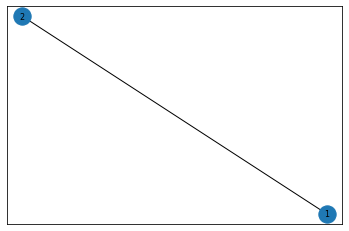

In [58]:
nx.draw_networkx(G, font_size=8)

In [59]:
import networkx as nx
import pandas as pd

data = {'source':["A", "A", "B", "B", "C", "F"],
        'destination':["B", "C", "C", "D", "D", "B"],
        'weight':[0.5, 0.2, 0.1, 0.1, 100, 1]}

df = pd.DataFrame(data)

g = nx.Graph()

weighted_edges = list(zip(*[df[col] for col in df]))

g.add_weighted_edges_from(weighted_edges)

In [60]:
list(zip(*[df[col] for col in df]))

[('A', 'B', 0.5),
 ('A', 'C', 0.2),
 ('B', 'C', 0.1),
 ('B', 'D', 0.1),
 ('C', 'D', 100.0),
 ('F', 'B', 1.0)]

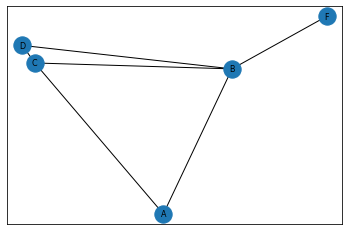

In [61]:
nx.draw_networkx(g, font_size=8)

### PR Contributions Weighted Graph

In [62]:
df_melted_pr

,Repo ID,Contributor,number
0,27017,25447,0
1,27020,25447,0
2,27022,25447,0
3,27028,25447,0
4,27029,25447,0
...,...,...,...
7145,27036,2579485,0
7146,27041,2579485,0
7147,27043,2579485,0
7148,27044,2579485,0


repo 1, repo 2, total contributions by common contributors  
repo 1, repo 4, total contributions by common contributors  
repo 2, repo 4, total contributions by common contributors  

27572, 36109, 45124+3325+1+1+1+9+10  
27572, 36108, 15  
  
contributor1: [(repo_id1, number1), (repo_id2, number2), ...]  
contributor2: [(repo_id1, number1), (repo_id2, number2), ...]  
  
contributor1: [((repo_id1, repo_id2), number1+number2), ((repo_id1, repo_id3), number1+number3), ...]  
  

In [63]:
contributorGraph = {}
for i, row in df_melted_pr.iterrows():
    if row['Contributor'] not in contributorGraph:
        contributorGraph[row['Contributor']] = []
    if(row['number'] > 0):
        contributorGraph[row['Contributor']].append((row['Repo ID'], row['number']))
print(contributorGraph)

{25447: [(27036, 1)], 25450: [(27032, 1)], 25451: [(27044, 1)], 25546: [(27044, 2)], 25571: [(27017, 2)], 26114: [(27047, 100000)], 26450: [(27017, 10), (27028, 1), (27032, 1), (27044, 10), (27047, 100000)], 26650: [(27044, 2)], 26723: [(27047, 50000)], 27337: [(27017, 106), (27032, 1), (27041, 1), (27044, 90), (27047, 200000)], 27430: [(27044, 1)], 27949: [(27032, 1)], 28077: [(27044, 1)], 28265: [(27017, 1), (27033, 1)], 28297: [(27029, 1)], 28368: [(27032, 3)], 28671: [(27032, 1)], 28920: [(27028, 1)], 29812: [(27028, 1), (27033, 1)], 30149: [(27041, 1)], 30288: [(27036, 1), (27041, 1)], 30315: [(27043, 1)], 30424: [(27028, 1), (27033, 2), (27041, 2)], 30777: [(27017, 1)], 30845: [(27017, 18), (27028, 35), (27029, 20), (27032, 10), (27033, 33), (27034, 1), (27041, 3), (27043, 155), (27044, 31), (27047, 7000000)], 30903: [(27017, 2), (27044, 1)], 32204: [(27028, 2)], 32776: [(27032, 2), (27041, 2)], 32925: [(27017, 2), (27044, 1)], 33083: [(27032, 1)], 33090: [(27032, 1)], 33094: [(2

In [64]:
import collections
commonRepoContributionsByContributor = collections.defaultdict(int)
for key in contributorGraph:
    if len(contributorGraph[key])-1 <= 0:
        continue
    for repoContributionIndex in range(len(contributorGraph[key])-1):
        print(commonRepoContributionsByContributor[(contributorGraph[key][repoContributionIndex][0], contributorGraph[key][repoContributionIndex+1][0])])
        commonRepoContributionsByContributor[(contributorGraph[key][repoContributionIndex][0], contributorGraph[key][repoContributionIndex+1][0])] += contributorGraph[key][repoContributionIndex][1]+contributorGraph[key][repoContributionIndex+1][1]
#     contributorGraph[key] = commonRepoContributionsByContributor
print(commonRepoContributionsByContributor)

0
0
0
0
0
0
0
100010
0
0
0
2
0
11
0
0
0
0
0
0
0
300100
0
2
3
5
0
7300131
0
64
3
8100132
0
0
0
336
9850458
6
8
10000459
338
18
2
10050465
0
0
186
12450595
12750598
15
19
12800609
0
0
12850610
0
13300619
554
2
43
4
158
191
13350621
107
50
133
30000677
0
0
0
3
50001
0
0
0
170
138
30100678
117
5
7
31550694
952
0
23
956
338
31600695
27
4
0
32
39950748
2
0
5
986
403
0
406
41
57
40100754
989
408
60
0
170
249
0
0
181
40200758
1003
192
0
252
40300760
58
0
410
22
0
35
165
42600767
15
0
107
23
23
55
30
63
34
0
2
173
262
42800768
50001
1023
420
102152131
1209
0
167
102302166
614
53
217
269
103152170
1060
483
103202173
37
17
91
103502202
228
11
69
1400
200
1165
329
545
143
616
452
1821
103652222
517
104252237
71
537
104402238
104452239
233
0
74
78
85
1073
539
104552241
91
72
12
1838
95
97
104602242
113
100002
74
200005
2
115
117
119
127
0
0
588
590
4
100008
593
104752255
598
250
129
133
150009
104902259
250010
138
140
142
145
1123
600
104952260
defaultdict(<class 'int'>, {(27017, 27028): 1130, (270

In [65]:
commonRepoContributionsByContributor

defaultdict(int,
            {(27017, 27028): 1130,
             (27028, 27032): 344,
             (27032, 27044): 46,
             (27044, 27047): 105752261,
             (27017, 27032): 189,
             (27032, 27041): 6,
             (27041, 27044): 123,
             (27017, 27033): 76,
             (27028, 27033): 276,
             (27036, 27041): 621,
             (27033, 27041): 31,
             (27028, 27029): 1211,
             (27029, 27032): 360,
             (27032, 27033): 549,
             (27033, 27034): 289,
             (27034, 27041): 4,
             (27041, 27043): 457,
             (27043, 27044): 1842,
             (27017, 27044): 157,
             (27033, 27044): 275,
             (27028, 27044): 607,
             (27022, 27041): 30,
             (27017, 27036): 9,
             (27036, 27044): 17,
             (27017, 27029): 6,
             (27029, 27043): 3,
             (27028, 27034): 39,
             (27034, 27044): 10,
             (27017, 27047): 350012,
  

In [66]:
res = ()
for key in commonRepoContributionsByContributor:
    res = tuple(str(k) for k in list(key)) + (commonRepoContributionsByContributor[key],)

In [67]:
[res]

[('27041', '27047', 150001)]

In [68]:
g = nx.Graph()

g.add_weighted_edges_from([res])

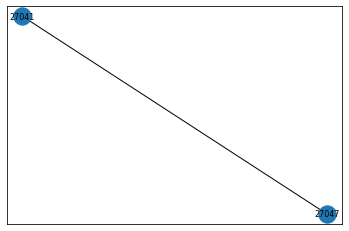

In [69]:
nx.draw_networkx(g, font_size=8)